In [1]:
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

In [3]:
#load data from transalted json and switch the transalted-Content as 'website_text'
df = pd.read_json('../../data/preprocessed/translated_results_en.json')

# Display the modified DataFrame
df

,name,original_idx,website_url,website_text,original_language,website_text_in_en
0,itravel,0,https://www.itravel.de/,itravel Telefonische Beratung +49 221 8282 888...,de,itravel Telefonische Beratung +49 221 8282 888...
1,kunveno,2,https://kunveno.de,Kunveno - Work Happier WORK HAPPIER Booste Unt...,de,Kunveno - Work Happier WORK HAPPIER Booste Unt...
3,Scopas,4,https://www.scopas.io/,ScopasWe're working on something new.Check it ...,en,ScopasWe're working on something new.Check it ...
4,studymaniac,5,https://studymaniac.de,Studymaniac - erfolgreich Studieren Open main ...,de,Studymaniac - erfolgreich Studieren Open main ...
6,Aicone,9,http://www.ai-c.one,Aicone - Artificial Intelligence Cloud One | A...,en,Aicone - Artificial Intelligence Cloud One | A...
...,...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,Coleap Transform your content into incomeTurn ...,en,Coleap Transform your content into incomeTurn ...
3285,Trade Machines FI,4995,http://trademachines.com,▷ All used industrial equipment online on Trad...,en,▷ All used industrial equipment online on Trad...
3286,Yasoon,4996,http://yasoon.com/,Home - yasoon Patrick Partner Manager Get in t...,en,Home - yasoon Patrick Partner Manager Get in t...
3287,Phoneboost,4997,https://www.phoneboost.de/,Phoneboost – Boost up your phone! AKKU LEER?PH...,de,Phoneboost – Boost up your phone! AKKU LEER?PH...


In [4]:
# import packages
import re

# import pandas as pd
# import numpy as np

# import matplotlib.pyplot as plt
# import seaborn as sns

import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
nltk.download('stopwords')


from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import GaussianNB

# from skmultilearn.problem_transform import BinaryRelevance

[nltk_data] Downloading package stopwords to /Users/kathi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# define functions

def cleanPunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]', r'', sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]', r' ', cleaned)
    cleaned = re.sub(r'[äÄ]', 'ä', cleaned)
    cleaned = re.sub(r'[öÖ]', 'ö', cleaned)
    cleaned = re.sub(r'[üÜ]', 'ü', cleaned)
    cleaned = cleaned.strip()
    return cleaned

def keepAlpha(sentence):
    alpha_sent = ""
    for word in sentence.split():
        alpha_word = re.sub('[^a-zA-ZäöüÄÖÜß]+', ' ', word, flags=re.UNICODE)
        alpha_sent += alpha_word
        alpha_sent += " "
    alpha_sent = alpha_sent.strip()
    return alpha_sent

def removeStopWords(sentence, stopwords):
    re_stop_words = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)   
    return re_stop_words.sub(" ", sentence)

def stemming(sentence):
    stemSentence = ""
    for word in sentence.split():
        stem = stemmer.stem(word)
        stemSentence += stem
        stemSentence += " "
    stemSentence = stemSentence.strip()
    return stemSentence

# define stopwords
stop_words = set(stopwords.words(['english']))

# define stemmer
stemmer = SnowballStemmer('english')

df['website_text'] = df['website_text'].astype(str)
# apply functions
df['website_text'] = df['website_text'].str.lower()
df['website_text'] = df['website_text'].apply(cleanPunc)
df['website_text'] = df['website_text'].apply(keepAlpha)
df['website_text'] = df['website_text'].apply(removeStopWords, stopwords=stopwords)
df['website_text'] = df['website_text'].apply(stemming)

In [7]:
df

,name,original_idx,website_url,original_language,website_text
0,itravel,0,https://www.itravel.de/,de,itravel telefonisch beratung schweiz rückruf v...
1,kunveno,2,https://kunveno.de,de,kunveno work happier work happier boost untern...
3,Scopas,4,https://www.scopas.io/,en,scopaswer work someth new check here
4,studymaniac,5,https://studymaniac.de,de,studymaniac erfolgreich studieren open main me...
6,Aicone,9,http://www.ai-c.one,en,aicon artifici intellig cloud one advanc analy...
...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,en,coleap transform content incometurn content in...
3285,Trade Machines FI,4995,http://trademachines.com,en,use industri equip onlin trademachinesenglishu...
3286,Yasoon,4996,http://yasoon.com/,en,home yasoon patrick partner manag get touch mi...
3287,Phoneboost,4997,https://www.phoneboost.de/,de,phoneboost boost phone akku leerphoneboostvoll...


In [9]:
# Erstelle den TF-IDF-Vektorizer
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df['website_text'])

In [10]:
# Führe das Hierarchische Clustering durch
num_clusters = 24  # Anzahl der Cluster
clustering = AgglomerativeClustering(n_clusters=num_clusters)
clustering.fit(tfidf_matrix.toarray())
cluster_labels = clustering.labels_

In [11]:
df['Cluster'] = cluster_labels
df

,name,original_idx,website_url,original_language,website_text,Cluster
0,itravel,0,https://www.itravel.de/,de,itravel telefonisch beratung schweiz rückruf v...,4
1,kunveno,2,https://kunveno.de,de,kunveno work happier work happier boost untern...,7
3,Scopas,4,https://www.scopas.io/,en,scopaswer work someth new check here,0
4,studymaniac,5,https://studymaniac.de,de,studymaniac erfolgreich studieren open main me...,12
6,Aicone,9,http://www.ai-c.one,en,aicon artifici intellig cloud one advanc analy...,23
...,...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,en,coleap transform content incometurn content in...,6
3285,Trade Machines FI,4995,http://trademachines.com,en,use industri equip onlin trademachinesenglishu...,6
3286,Yasoon,4996,http://yasoon.com/,en,home yasoon patrick partner manag get touch mi...,6
3287,Phoneboost,4997,https://www.phoneboost.de/,de,phoneboost boost phone akku leerphoneboostvoll...,7


---------------------------------------------Cluster 0:---------------------------------------------
scopaswer work someth new check here

luxflux metrolog meet comput vision search search hyperspectr high perform softwar industri randd metrolog meet comput vision digitaltwin semiconductor solut get free demo softwar current use case luxflux proud comprehens metrolog portfolio perovskit metrolog alreadi use randd industri environ pleas contact luxflux develop technolog measur tini dimens attach sampl measur metal workpiec turn groov laser luxflux develop technolog visual wide varieti materi properti exampl differ structur color news luxflux particip vision trade show stuttgart look forward welcom booth luxflux ceo dr jan makowski give quick demo opsi hsi imag spectro scanner develop partnership eko instrument luxflux gmbh present spie photon west held san francisco th th februari über un us contactgerhard kindler straße reutlingen germani social media luxflux proud power by

microgan g

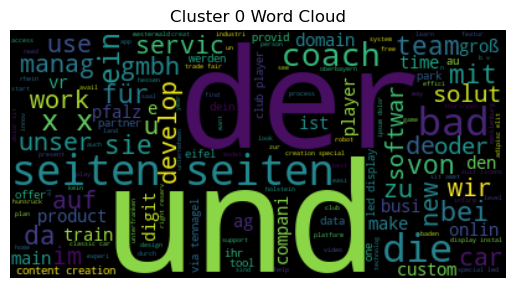

---------------------------------------------Cluster 1:---------------------------------------------
book taxi limousin onlin talixo en talixo corpor choic fortun compani book web mobil obe countri talixo smes take control transfer expens onlin payment invoic worldwid travel agenc book manag trip everywher world includ china india api integr book taxi limousin transfer track updat commiss fleet use fleet manag tool busi receiv book talixo book taxi limousin choos car detail payment pleas provid street address airport name hotel name pick system didnt recognis address pleas make sure correct street address airport hotel name venu estim arriv time next taxi address minut sorri current taxi avail address hous number pleas provid hous number flight number departur citi pleas provid street address airport name hotel name destin system didnt recognis address pleas make sure correct street address airport hotel name venu hous number pleas provid hous number today tomorrow wednesday base fligh

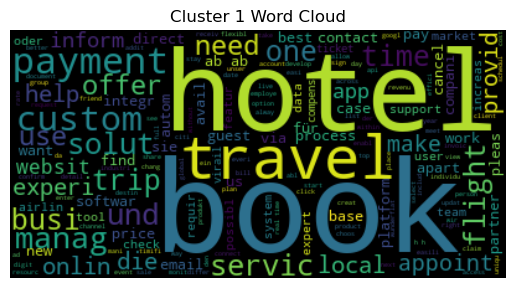

---------------------------------------------Cluster 2:---------------------------------------------
magnotherm next generat cool zero gwp toxic explos magnotherm build high effici sustain cool system base magnetocalor materi instead climat damag hazard refriger gase use temperatur activ metal combin water applic supermarket refriger liquifi hydrogen polari polari revolutionari beverag magnet cooler effici sustain cool system base magnetocalor technolog offer energi save reduc emiss without tradit refriger compressor benefit high effici f gas free green technolog near nois free effici scale also heat pump support news arberesh arifi jun min read arberesh arifi may min read arberesh arifi may min read arberesh arifi may min read arberesh arifi may min read arberesh arifi apr min read arberesh arifi apr min read arberesh arifi apr min read arberesh arifi apr min read timur sirman mar min read youv success subscrib magnotherm subscrib magnotherm unlock futur cool magnotherm subscrib stay 

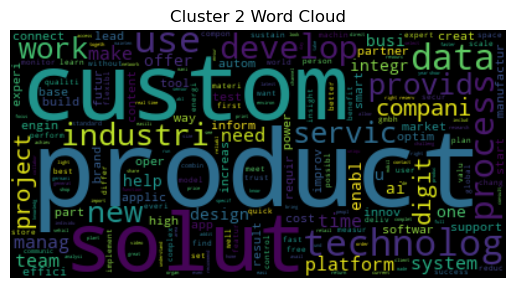

---------------------------------------------Cluster 3:---------------------------------------------
start cuculus gmbh dein browser unterstützt leider nicht all funktionen dieser websit bitt aktualisier ihn auf ein neuer version oder hol dir einen modernen browser ignorieren afford energi water everyon joint partner network provid softwar solut address util challeng futur scroll afford energi water everyon joint partner network provid softwar solut address util challeng futur vision afford energi water everyon cuculus key provid util protect world precious resourc provid cut edg softwar technolog solut address util challeng worldwid need help tailor cuculus experi develop websit want improv much like belief product develop build test analys improv product part journey believ appli websit welcom feedback partner famili hand hand solv challeng util space partnership key solv biggest energi challeng next centuri cuculus partner play pivot role achiev mission vision togeth build innov pro

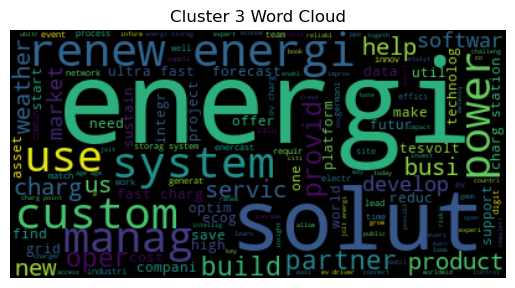

---------------------------------------------Cluster 4:---------------------------------------------
itravel telefonisch beratung schweiz rückruf vereinbaren de erlebniss highlight reisethemen reiseziel servic stellen sie sich jetzt ihr individuell traumreis zusammen oder rufen sie un unter segeltörn weltweitleinen los inspir entdecken sie sehnsuchtsziel besonder unterkünft und spannend erlebniss individuell reiseplanung erhalten sie reisevorschläg von unseren experten maßgeschneidert und unverbindlich itravel reis erleben sie mit itravel und ausgewählten partnern ihr persönlich traumreis sri lanka rundreis flug hotel direkt buchen und sparen neue individualreisen empfehlungen für ihr reiseplanung nachhaltigkeit nachhaltigkeit liegt un herzen zum schutz unser planeten sowi zum erhalt der artenvielfalt und kulturel reichtümer unterstützt itravel ein vielzahl organisationen und projekten mit unseren partnerschaften übernehmen wir die verantwortung die reisen unser kunden und unser geschä

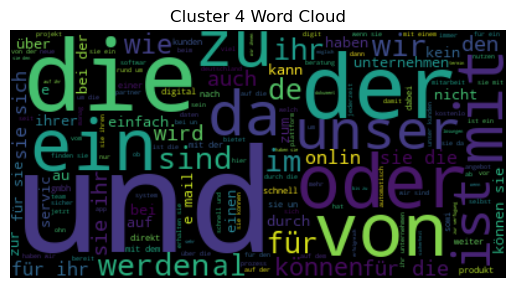

---------------------------------------------Cluster 5:---------------------------------------------
home bosetein ensur safeti foodour real time bacteri inspect technolog revolution food inspectionwhat dow enabl custom measur qualiti quantifi safeti meat product real time non invas way servic measur hygien rebi enabl measur hygien condit meat product real time wait day know test result quantifi fresh non invas uniqu technolog allow quantifi fresh food item anywher food suppli chain predict shelf life measur true shelf life product along suppli chain better manag stock reduc food wast real time bacteri inspect sensor solv problem food loss wasteranddtogeth research institut univers develop stand alon hand held sensor perform spoilag detect real time techth sensor util optic technolog ai algorithm estim fresh level meat item base number bacteria packag real time rebisrebi easi use anyon oper util along entir suppli chain farm fork also easi integr exist infrastructur uniqu sell pointsou

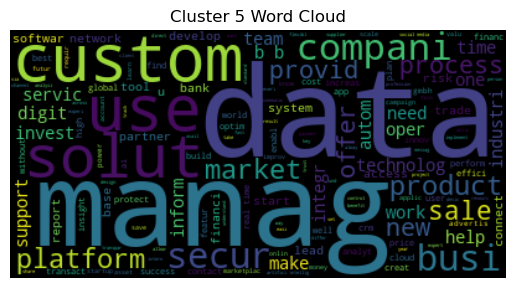

---------------------------------------------Cluster 6:---------------------------------------------
teraspintec gmbh home spintron terahertz sourc key ultrabroadband terahertz spectroscopi home spintron terahertz emitt spin right let innov spintron terahertz emitterunlock full potenti terahertz lab featur thz bandwidth without spectral gap mid infrar x ray use pump wavelength pump polar like fulli passiv thz emitt equip integr magnet allow full thz polar control generat thz electr field reach kv cm long term stabil reli stabl perform time minim invas implement setup thz beam characterisitc inherit pump beam spin work prototyp spintron terahertz emitt demonstr work principl note come fulli integr magnet design ultrabroadband detect enabl detector fast delay stage spin everywher remark spectrum gap free exceed spectral amplitud znte gap crystal thz nat phot effici thz generat essenti flat excit fs puls center wavelength rang nm apl demonstr ghost spintron thz emitt array microscop ghost

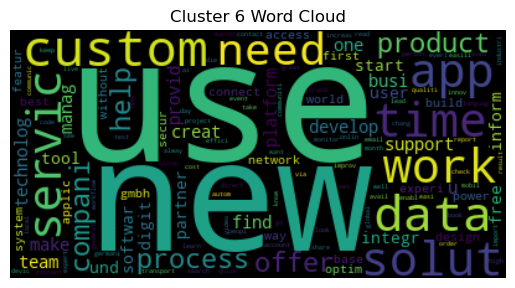

---------------------------------------------Cluster 7:---------------------------------------------
kunveno work happier work happier boost unternehmenskultur und schaff high perform team mit echter wertschätzung bereit für neue höhen kunveno ist dein posit hub um wertschätzung aller couleur arbeitsplatz auszutauschen sichtbar zu machen und fest der dna deiner unternehmenskultur zu verankern ein kleiner sehnsuchtsort mit großem effekt für mehr resilienz mehr produktivität und geringer fluktuat im hektischen arbeitsalltag basierend auf user review führend unternehmen setzen auf kunveno cultur eat strategi breakfast boost dein unternehmenskultur ob führungskraft oder mitarbeit mit kunveno kann jeder deinem unternehmen posit feedback senden und erhalten samml posit moment und mach sie für jeden erlebbar ob im team meet ad hoc oder al livetick es braucht nur wenig klick um gemeinsam ein unternehmenskultur aufzubauen der sich jeder gesehen und geschätzt fühlt deshalb lohnt sich kunveno den

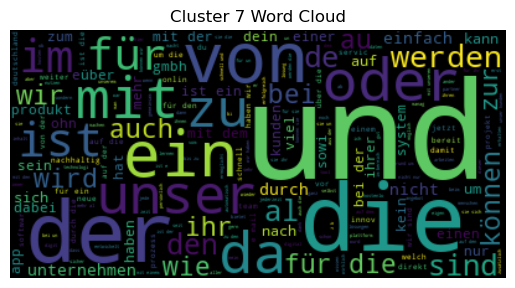

---------------------------------------------Cluster 8:---------------------------------------------
home givetast org top pagewalletwalletwalletcareersmeet team moreus tab navig menu item empoweryouremploye bring employe social respons organ engag employe last posit impact remot escap partner learn work work creat digit wallet employe via app compani creat fulli customiz give wallet desir donat budget employe creat equal size coupon wallet budget divid among employe givetast app great fusion emot narrat swarm intellig function top uwe berger ceo bandb markenagentur gmbhhow creat last posit impactbi give money set digit wallet individu donat budget employe choos accredit projectsth missionw believ everi person everi organ make world better place goal promot social engag transpar empow individu creat posit social impact newslettersign stay date becom part journey subscribethank subscrib keep loopcompanylegalappscontactbottom page

anton free learn app school

lftd great excel togeth upl

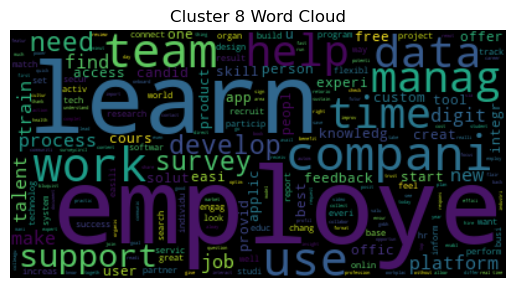

---------------------------------------------Cluster 9:---------------------------------------------
einfach e auto einfach e auto e auto wallboxen ladekarten thg quoten e wissen funktioniert es fertig ohn umweg zum e auto find ganz einfach dein perfekt e auto komplettpaket kostenlo unser servic ist für dich komplett kostenfrei wie wir geld verdienen erklären wir weiter unten rundum sorglo mit unseren self servic assistenten findest du heraus welch e auto und wallboxen für dich passen attrakt angebot mit deinem kostenfreien account erhältst du günstige angebot zu wallboxen und e auto immer zuerst aus unserem angebot unterstützen wir dich gesamtpaket entdecken unser assist führt dich mit einfachen fragen zu deinem gesamtpaket vom e auto bis zum förderprogramm all rund um dein e auto klick auf die kreis um zu erfahren wie wir dich unterstützen überglücklich e auto fahrer geworden jakob aus münchen finanziert sich einfach e auto unser dienstleistungen sind für dich immer kostenlo wir erha

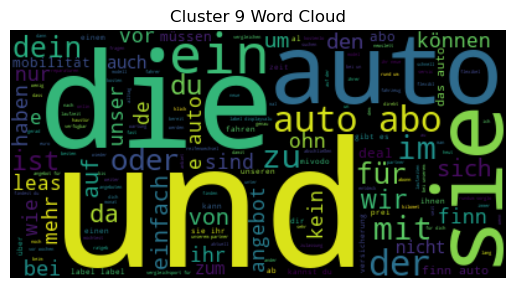

---------------------------------------------Cluster 10:---------------------------------------------
cloud readi softwar gmbh cloud readi softwar com take fast lane cloud product managerw compel busi case think bring ip appsourc need make right choic futur fingertip show way head itmicrosoft appsourc power stack seem ideal way ad valu product need figur get start org lead process red tape execut ceotechnolog mean end want focus grow busi increas revenu make custom happi focus busi leav technolog us bring peopl togeth servic busi appsyou expertis make differ industri segment expertis turn know app migrat app cloud power platformth power data power integr powerbi power app microsoft flow deep dive data help easili establish workflow busi process azur servicesai iot cognit servic glad uncov world azur servic intellig edg add exponenti valu offer marketingmarket new sale especi come cloud busi let creat excit user experi brilliant websit turn product lifestyl love happi clientswhat client

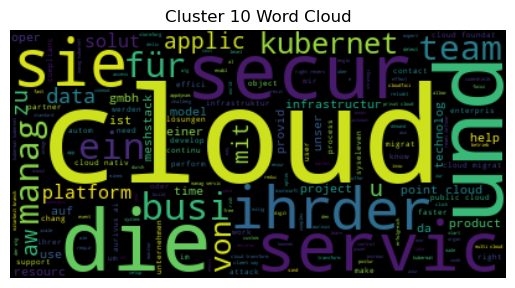

---------------------------------------------Cluster 11:---------------------------------------------
time token nft collect nft collect direkt zur ausstellung das auktionshaus van ham versteigert dezemb einen von der uhrenmanufaktur hanhart aufgelegten hybriden nft der nft verbrieft nicht nur das recht den digitalen entwürfen design und render sondern berechtigt auch zum bau der hanhart cxd al unikat der realen welt der nft startet mit einer tax von euro der zuschlagsprei betrug euro zusammen mit aufgeld und steuern liegt der prei bei euro excit thing come soon schreiben sie sich ein um sofort informiert zu werden wir versorgen sie mit informationen aus erster hand neue nfts neue drop pläne vorhaben sammler die in metaversum streben kollabierend universen oder expandierend sonnen dazu brauchen wir nur ihr mailadress ich habe die datenschutzerklärung gelesen und stimm dieser zu abonnieren copyright nft collect eduardo pampinella scroll zustimmen gdpr cooki banner schließen

cpay cflox 

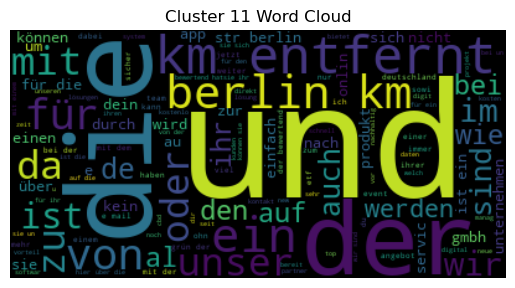

---------------------------------------------Cluster 12:---------------------------------------------
studymaniac erfolgreich studieren open main menu dein partner für ein erfolgreich studium qualitativ hochwertig kurs die genau auf dein hochschul zugeschnitten sind mit studymaniac wird dein nächste klausur ein kinderspiel unser kurs werden von ausgewählten expert innen erstellt und sind darauf ausgerichtet dir zeit beim verstehen der themen zu sparen und dich ideal auf die klausur vorzubereiten schnell verstehen einfach erklärungen versteh das kompliziert thema aus der zweistündigen vorlesung wenigen minuten anhand kurzer video und skripten mit ausführlichen beispielen überal lernen digital karteikarten mit unser karteikarten app macht selbst auswendiglernen von langweiligen themen spaß perfekt vorbereitung interakt probeklausuren wie gut du schon vorbereitet bist lässt sich leicht mit unseren interaktiven probeklausuren überprüfen come soon studium praxi durch un kommst du schon währ

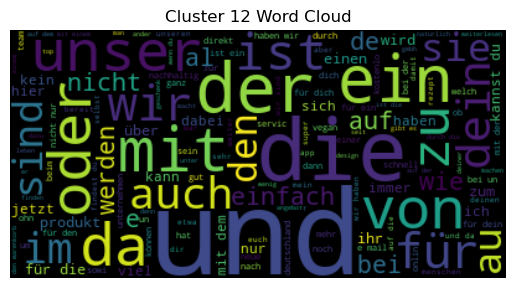

---------------------------------------------Cluster 13:---------------------------------------------
deepmello friend leipzig slow fashion fine live willkommen bei deepmello friend shop shop damen damen herren herren taschen taschen accessoir accessoir interior interior über un über un shop damen herren taschen accessoir interior über un artikel wurd den warenkorb gelegt auschecken weiter shoppen slow fashion fine livingmit deepmelloandfriend präsentieren wir von un und befreundet mit einer gemeinsamen vision von ehrlichen fairen und nachhaltigen produkten aktuell kollekt normal prei eur normal prei verkaufsprei eur grundprei pro normal prei eur normal prei verkaufsprei eur grundprei pro ausverkauft normal prei eur normal prei verkaufsprei eur grundprei pro normal prei eur normal prei verkaufsprei eur grundprei pro beliebt produkt normal prei eur normal prei verkaufsprei eur grundprei pro normal prei eur normal prei verkaufsprei eur grundprei pro normal prei eur normal prei verkaufspr

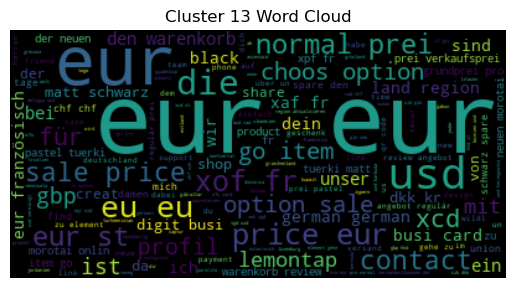

---------------------------------------------Cluster 14:---------------------------------------------
demecan medizinisch cannabi made germani menu medic cannabi made germani order medic cannabi pharmaci order direct us inform visit shop hire offer great career opportun three differ locat germani becom part demecan team contact us question help pleas find contact detail demecan independ german compani cover manufactur step medic cannabi cultiv process storag deliveri pharmaci germani mission patient germani ensur reliabl suppli medic cannabi highest pharmaceut qualiti hope legal recreat cannabi also facilit access medic cannabi berlin startup germani largest cannabi produc demecan independ german compani licenc grow process medic cannabi germani demecan award contract german feder govern bfarm product cannabi flower medic use demecan receiv suppli agreement valid period four year annual quantiti ton dri cannabi flower product take place eu gmp certifi product facil near dresden complia

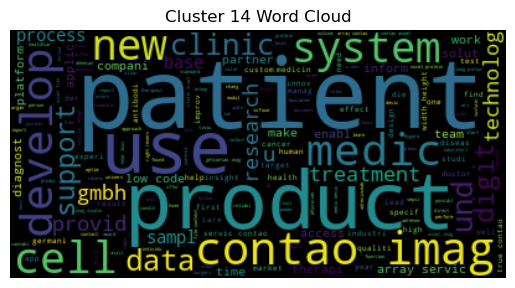

---------------------------------------------Cluster 15:---------------------------------------------
der klein gourmet versandkostenfrei de ab ohn zusätz vegan schneller versand mit dhl liebevoll handarbeit mein konto kundenkonto oder nach der anmeldung kannst du hier auf dein kundenkonto zugreifen suchen kategorien der klein gourmet zahlung versand newslett jetzt newslett abonnieren und immer über all würzigen neuigkeiten informiert sein jetzt abonnieren die habe ich zur kenntni genommen social media der klein gourmet all recht vorbehalten all preis inkl gesetzl mehrwertsteu zzgl und ggf nachnahmegebühren wenn nicht ander beschrieben valentinstag special rabatt mit dem code lieb trust shop review toolkit

paul clara sicher dhl versand günstiger kleinversand per brief design fragen suchen mein konto oder suchen mein konto oder kategorien informationen abonnier unseren newslett bestellen ich habe die zur kenntni genommen folgen sie un email support fragen schreib un shop servic informa

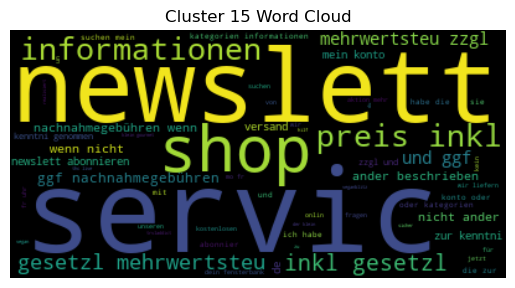

---------------------------------------------Cluster 16:---------------------------------------------
crazybunch video game develop toggl navig hi crazybunch crazybunch product develop compani video game interact media base hamburg germani game crazybunch love make game enjoy play meet bunch team creativ bunch develop game design artist work togeth success mani game mani year also fun around heiner ceo research develop barbar ceo technic director malt ceo creativ director alic art director caro head art jo art anim noodi art anim alara art anim svenja game design write alway bring banana parti get touch general enquiri send us email press feel free check drop us email at

less artifici intellig next generat game ai quantum game gmbh quantum game marbl ai roll smart game learn use modern ai develop right quantum game team excit announc pioneer ai mobil game game learn watch ai learn time learn ai gameplay marbl aia marbl start knowledg bodi environ rule game game charact game world simu

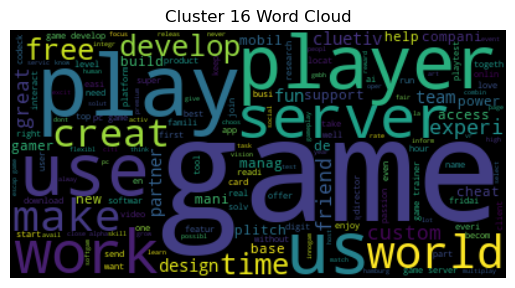

---------------------------------------------Cluster 17:---------------------------------------------
vegdog vegan premium hundefutt von tierärzten entwickelt vegdog shop über un über un über un artikel im warenkorb jetzt kaufen weiter shoppen vegdog das best vegan hundefutterrett die welt und ernähr deinen vierbein mit unseren vegdog highlight normal prei verkaufsprei grundprei ab pro kg den warenkorb spartipp normal prei verkaufsprei grundprei ab pro kg den warenkorb spartipp normal prei verkaufsprei grundprei ab pro kg den warenkorb spartipp normal prei verkaufsprei grundprei ab pro kg den warenkorb spartipp normal prei verkaufsprei grundprei ab pro kg den warenkorb spartipp normal prei verkaufsprei grundprei ab pro den warenkorb spartipp warum vegdog vegdog pflanzlich von tierärzten entwickelt vollwertig alleinfutt gluten und sojafrei good ohn tierversuch minimal co fussabdruck lässt all tier leben tierschutz aktivitäten feed better hochwertig zutaten best verträglichkeit all notwe

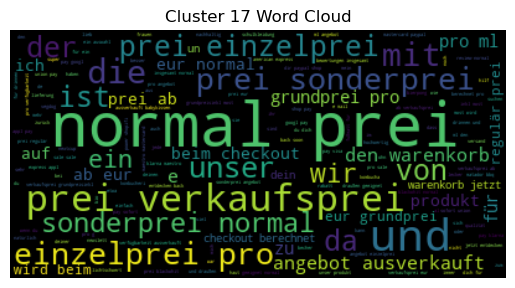

---------------------------------------------Cluster 18:---------------------------------------------
spacewis dein ort für platz endlich platz buchen günstige garagen lager und stellplätz deiner nähe besser nicht verpassenplatz mietensuchenfind deinen perfekten platz genau da wo du ihn brauchst buchenbuch direkt über unser schlaue system nutzenverwend deinen platz genau wie du es willst ganz unkompliziert menschen lieben spacewiseda ich kein auto besitz stand mein stellplatz bisher immer leer obwohl ich dafür bezahlen muss auf spacewis habe ich jetzt einen mieter gefunden und bekomm das geld direkt auf mein konto jana privatkundeich musst sehr spontan mein möbel zwischenlagen innerhalb von ein paar minuten habe ich einen passenden keller gefunden mit dem vermiet geschrieben gebucht gezahlt und die möbel eingelagert einfach und sicher geht es nicht lui l privatkundeich wusst vorher gar nicht dass ich meinen keller vermieten darf und kann und dafür soviel geld bekomm das angebot zu erst

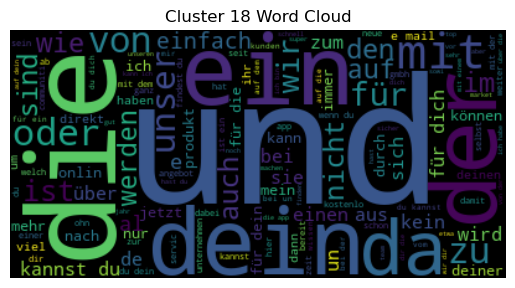

---------------------------------------------Cluster 19:---------------------------------------------
leap onlin healthcar educ africa onlin healthcar educ africa learn top global institut industri expert start acceler career healthcar sign free onlinelearn pace anywher affordableenjoy free afford cours certifiedearn certif complet choos cours learnworld codeneuron page zonerender coursecard learn top univers institut program enrich lot recommend health profession set among peer safiatou learner ghana leap newsroom blog latest updatesse news updat health articl webinar survey leap health seri busi look new way digit workflow take survey best tailor health seri webinar survey start learn today learnexplor cours start learn healthcar africa experiencegain new skill implement field right away achieveearn certif top institut access new opportun prospertak career next level support communiti partner usif educ institut look support local health need across africa partner us adam feinvp digit

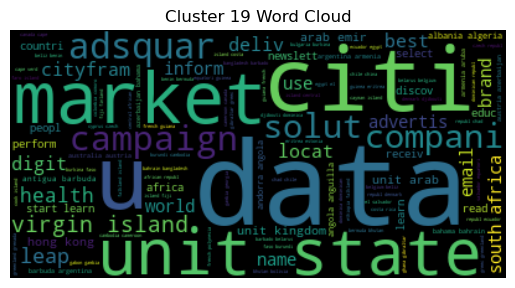

---------------------------------------------Cluster 20:---------------------------------------------
hoogst spaarrent de europes uni raisin u bezoekt de websit nederland select een ander opti al u een ander land woonachtig bent nederland bevestigen uitloggen uitloggen europa grootstespaarbemiddelaar spaar met raisin via n account tegen toprent tot per jaar bij banken uit de eu de hoogst spaarrent europa meer dan europes spaarder gingen je al voor spaar over met de raisin app spaar over met de raisin app met de raisin app open en beheer je je deposito en spaarrekeningen de eu eenvoudig op je smartphon tablet scan de qr code en start met sparen waarom sparen bij raisin met gemak naar toprentesregistr en identific je nmalig binnen enkel minuten spaar vervolgen bij de bank en naar keuz tegen toprent tot per jaar zekerheidmet raisin onlin bank heb je veilig toegang tot aantrekkelijk spaarrekeningen uit de eu met depositogaranti tot per bank gratisonz partnerbanken betalen on niet jij al on

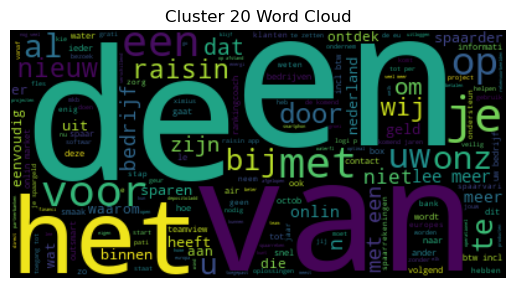

---------------------------------------------Cluster 21:---------------------------------------------
stream listen music onlin free soundcloud

music licens servic brand agenc artist label songtradr songtradr

ontrack music citi tour worldwid discov sound citi discov sound citi get digit guid local music cultur launch soon android io stuttgart ontrack music citi platform connect local music histori urban environ tell stori cultur interact mobil tour mobil phone florian müller discov sound citi ontrack tour content find person divers tour citi explor live discov excit behind scene content favorit music connect citi cultur histori enjoy song video multimedia content feel sound citi communiti part communiti exchang connect likemind peopl onlin offlin tag person music spot share stori experi let ontrack give emot experi explor urban music cultur get touch music histori discov sound citi part alway look local artist media peopl interest citi also editor work stori want place digit citi tou

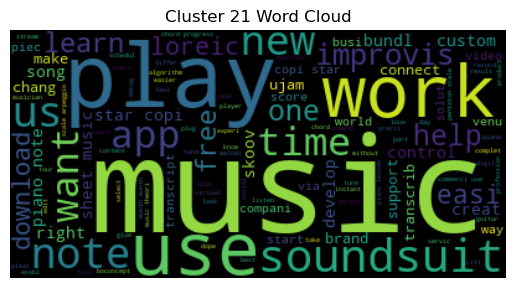

---------------------------------------------Cluster 22:---------------------------------------------
lead carbon account sustain decarbonis platform track reduc carbon footprint product servicessustain journey stepssustain solutionsindividu offeringscas studiescas studiescompanyaboutaboutresourcesdefinitionscalculatorsth sustain platform tomorrow climat leadersyour entir net zero journey one comprehens platform measur report reduc emiss guidanc lead carbon account decarbonis expert sustain platformth trust sustain solut net zero journeya global economi shift net zero help meet regulatori demand creat comprehens strategi boost bottom line autom corpor carbon account decarbonis esg report plan corpor sustain solut trust byth opportunitygain competit advantag decarbonis return investmentcompani disclos environment data ambiti emiss reduct target higher return invest dont sourc cdp sharehold returnscompani set scienc base target reduc carbon emiss outperform peer term sharehold return sou

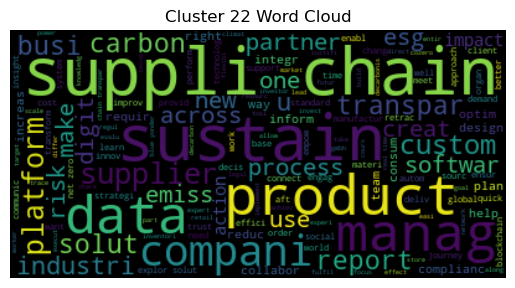

---------------------------------------------Cluster 23:---------------------------------------------
aicon artifici intellig cloud one advanc analyt fuel price aicon utilis big data provid advanc analyt us provid advanc analyt smart ai base softwar machin learn capabl servic help transform data decis make tool one stop partner qualiti assur cost effect provid advanc analyt machin learn capabl servic help transform data decis make tool year experi continu learn give us matur seamless integr client process dedic team work across time zone ensur complet project consist time within budget aicon autom system process ensur qualiti cost effect turnaround averag cost save client predict real time analyt predict mainten recommend system video imag voic recognit demand suppli forecast alert monitor simul compani individu economist plug differ scenario valu determin rang possibl outcom type analysi often done data limit compani want make inform decis cost effect regress perceptu map cluster anal

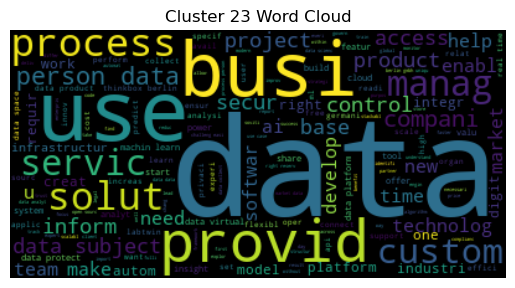

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Print texts for each cluster
for cluster in range(num_clusters):
    cluster_texts = df.loc[df['Cluster'] == cluster, 'website_text']
    print(f"---------------------------------------------Cluster {cluster}:---------------------------------------------")
    for text in cluster_texts:
        print(text)
        print()


    # Plot relevant words of the cluster
    cluster_text = ' '.join(cluster_texts)
    wordcloud = WordCloud().generate(cluster_text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Cluster {cluster} Word Cloud")
    plt.show()



Visualisierung der Cluster-Hierarchie: Sie können die hierarchische Struktur der Cluster mithilfe eines Dendrogramms darstellen. Ein Dendrogramm zeigt die Verbindungen zwischen den Clustern als Baumstruktur. Sie können die Methode linkage aus der scipy-Bibliothek verwenden, um die Verbindungen zwischen den Clustern zu berechnen, und dann die Methode dendrogram verwenden, um das Dendrogramm zu zeichnen. Hier ist ein Beispielcode:

In [15]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Berechne die Verbindungen zwischen den Clustern
linkage_matrix = linkage(tfidf_matrix.toarray(), method='ward')

# Zeichne das Dendrogramm
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=num_clusters)
plt.xlabel('Texte')
plt.ylabel('Distanz')
plt.title('Hierarchisches Clustering Dendrogramm')
plt.show()



Visualisierung der Cluster-Ähnlichkeiten: Sie können die Ähnlichkeiten zwischen den Clustern mithilfe einer Heatmap darstellen. Eine Heatmap zeigt die Ähnlichkeitswerte als Farbmatrix an. Sie können die Methode pairwise_distances aus der sklearn.metrics-Bibliothek verwenden, um die Ähnlichkeitsmatrix zwischen den Clustern zu berechnen, und dann die Methode imshow aus der matplotlib.pyplot-Bibliothek verwenden, um die Heatmap zu zeichnen. Hier ist ein Beispielcode:

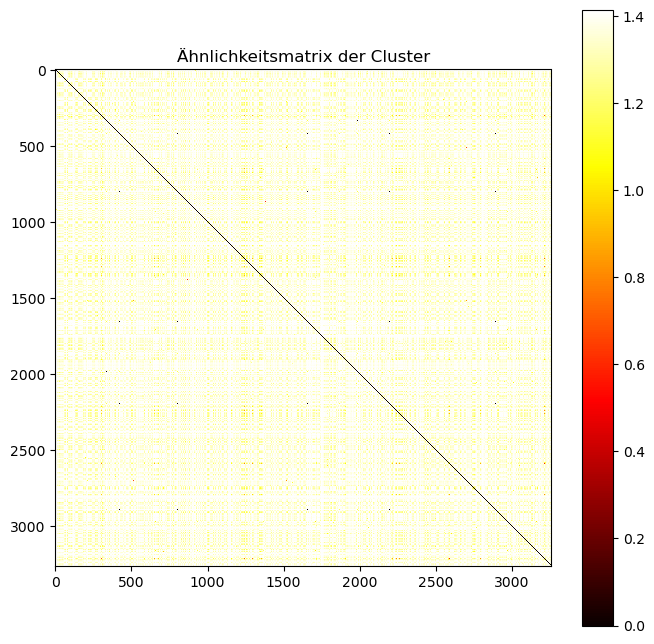

In [13]:
from sklearn.metrics import pairwise_distances
import numpy as np

# Berechne die Ähnlichkeitsmatrix zwischen den Clustern
cluster_distances = pairwise_distances(tfidf_matrix.toarray(), metric='euclidean')

# Zeichne die Heatmap
plt.figure(figsize=(8, 8))
plt.imshow(cluster_distances, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Ähnlichkeitsmatrix der Cluster')
plt.show()

Interpretation der Cluster: Betrachten Sie die Texte innerhalb jedes Clusters und versuchen Sie, gemeinsame Themen oder Charakteristika zu identifizieren. Lesen Sie einige der Texte in jedem Cluster, um ein Verständnis dafür zu entwickeln, welche Art von Inhalten oder Eigenschaften die Texte in einem Cluster teilen könnten. Sie können auch deskriptive Statistiken wie die Anzahl der Texte in jedem Cluster oder die durchschnittliche Ähnlichkeit zwischen den Texten in einem Cluster berechnen, um weitere Informationen über die Cluster zu gewinnen.